In [1]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import xml.etree.ElementTree as ET

from tqdm import tqdm
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

In [2]:
# This is needed to display the images.
%matplotlib inline

In [3]:
from object_detection.utils import label_map_util

from object_detection.utils import visualization_utils as vis_util

In [4]:
cwd = os.getcwd()

In [5]:
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(cwd + '/freeze/fine_tuned/frozen_inference_graph.pb', 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

In [6]:
label_map = label_map_util.load_labelmap(cwd + '/my_pictures/pascal_label_map.pbtxt')
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=80, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [7]:

def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape(
        (im_height, im_width, 3)).astype(np.uint8)

In [8]:
PATH_TO_TEST_IMAGES_DIR = cwd + '/my_pictures'
TEST_IMAGE_PATHS = [ os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image{}.jpg'.format(i)) for i in range(1, 7) ]

Freezing trained model

In [9]:
IMAGE_DIR = os.getcwd() + '/VOC2012/JPEGImages/'
ANNOTATION_DIR = os.getcwd() + '/VOC2012/Annotations/'

VOC_LABELS = {
    'none': (0, 'Background'),
    'aeroplane': (1, 'Vehicle'),
    'bicycle': (2, 'Vehicle'),
    'bird': (3, 'Animal'),
    'boat': (4, 'Vehicle'),
    'bottle': (5, 'Indoor'),
    'bus': (6, 'Vehicle'),
    'car': (7, 'Vehicle'),
    'cat': (8, 'Animal'),
    'chair': (9, 'Indoor'),
    'cow': (10, 'Animal'),
    'diningtable': (11, 'Indoor'),
    'dog': (12, 'Animal'),
    'horse': (13, 'Animal'),
    'motorbike': (14, 'Vehicle'),
    'person': (15, 'Person'),
    'pottedplant': (16, 'Indoor'),
    'sheep': (17, 'Animal'),
    'sofa': (18, 'Indoor'),
    'train': (19, 'Vehicle'),
    'tvmonitor': (20, 'Indoor'),
}

def get_annotation(annotation_name):
    root = ET.parse(annotation_name).getroot()

    image_sizes = root.find('size')
    shape = (int(image_sizes.find('height').text),
             int(image_sizes.find('width').text),
             int(image_sizes.find('depth').text))
    
    labels = []
    xmins = []
    ymins = []
    xmaxs = []
    ymaxs = []

    for obj in root.findall('object'):
        label = int(VOC_LABELS[obj.find('name').text][0])

        labels.append(label)
        
        bnd_box = obj.find('bndbox')

        xmin = float(bnd_box.find('xmin').text) / shape[1]
        ymin = float(bnd_box.find('ymin').text) / shape[0]
        xmax = float(bnd_box.find('xmax').text) / shape[1]
        ymax = float(bnd_box.find('ymax').text) / shape[0]
    
        xmins.append(xmin)
        ymins.append(ymin)
        xmaxs.append(xmax)
        ymaxs.append(ymax)
        
    xmins = np.array(xmins)
    ymins = np.array(ymins)
    xmaxs = np.array(xmaxs)
    ymaxs = np.array(ymaxs)

    bboxes = np.stack((xmins, ymins, xmaxs, ymaxs)).transpose()  
    
    return {'shape':shape, 'labels':labels, 
            'xmins':xmins, 'ymins':ymins, 
            'xmaxs':xmaxs, 'ymaxs':ymaxs, 
            'bboxes': bboxes}
    
def iterate_through_images(image_dir, annotation_dir):
    images = tf.gfile.ListDirectory(image_dir)
    annotations = tf.gfile.ListDirectory(annotation_dir)
    
    for image_name, annotation_name in zip(sorted(images), sorted(annotations)):
        annotation = get_annotation(annotation_dir + annotation_name)
        yield os.path.join(image_dir, image_name), annotation

def get_average_precision(gnd_boxes, gnd_labels, boxes, labels, scores):
    cond = scores > 0.3
    boxes = boxes[cond]
    labels = labels[cond]
    
    matches = 0
    
    def get_iou(gnd_truth_box, pred_box_coors):
        x_left = max(pred_box_coors[0], gnd_truth_box[0])
        y_left = max(pred_box_coors[1], gnd_truth_box[1])
        x_right = min(pred_box_coors[2], gnd_truth_box[2])
        y_right = min(pred_box_coors[3], gnd_truth_box[3])

        x_diff = x_right - x_left
        y_diff = y_right - y_left
        
        if x_diff < 0.0 or y_diff < 0.0:
            return 0.0
        
        intersection = x_diff * y_diff

        a_area = (pred_box_coors[2] - pred_box_coors[0]) * (pred_box_coors[3] - pred_box_coors[1])
        b_area = (gnd_truth_box[2] - gnd_truth_box[0]) * (gnd_truth_box[3] - gnd_truth_box[1])

        union_area = a_area + b_area - intersection
        
        return intersection / union_area
        
    
    def got_a_match(gnd_box, gnd_label, boxes, labels):
        max_iou = 0.0
        
        for i in range(boxes.shape[0]):
            cur_iou = get_iou(gnd_box, boxes[i])
            if cur_iou > max_iou:
                max_iou = cur_iou
            else:
                return 0
            if np.allclose(gnd_label, labels[i]):
                return 1
            else:
                return 0
        return 0
    
    for i in range(gnd_boxes.shape[0]):
        matches += got_a_match(gnd_boxes[i], gnd_labels[i], boxes, labels)
        
    return matches / gnd_boxes.shape[0]

In [10]:
IMAGE_SIZE = (30, 18)

In [11]:
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        
        count = 0
        
        average_precisions = []
        
        for image_path, annotation in iterate_through_images(IMAGE_DIR, ANNOTATION_DIR):
            count += 1
            
            image = Image.open(image_path)
            image_np = load_image_into_numpy_array(image)
            image_np_expanded = np.expand_dims(image_np, axis=0)

            (boxes, scores, classes, num) = sess.run(
                [detection_boxes, detection_scores, detection_classes, num_detections],
                feed_dict={image_tensor: image_np_expanded})
            
            gnd_boxes = annotation['bboxes']
            gnd_labels = annotation['labels']
            
            ap = get_average_precision(gnd_boxes, gnd_labels, boxes, classes, scores)
            average_precisions.append(ap)
            print('iter: {0}, current mAP: {1:.4f}'.format(count, np.array(average_precisions).mean()), end='\r')
        
        average_precisions = np.array(average_precisions).mean()
        print()
        print('mAP: {0:.4f}'.format(average_precisions))

iter: 17125, current mAP: 0.6520
mAP: 0.6520


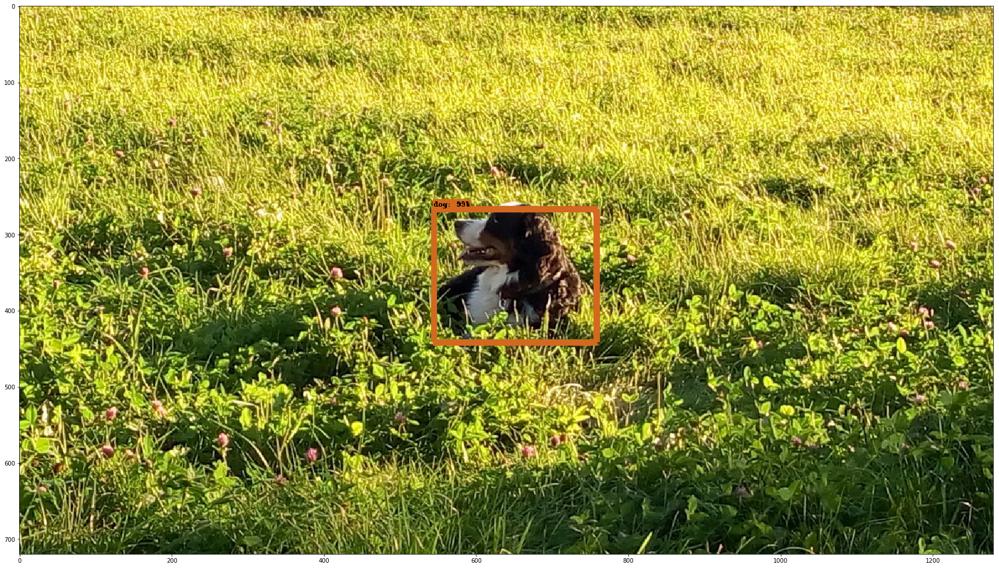

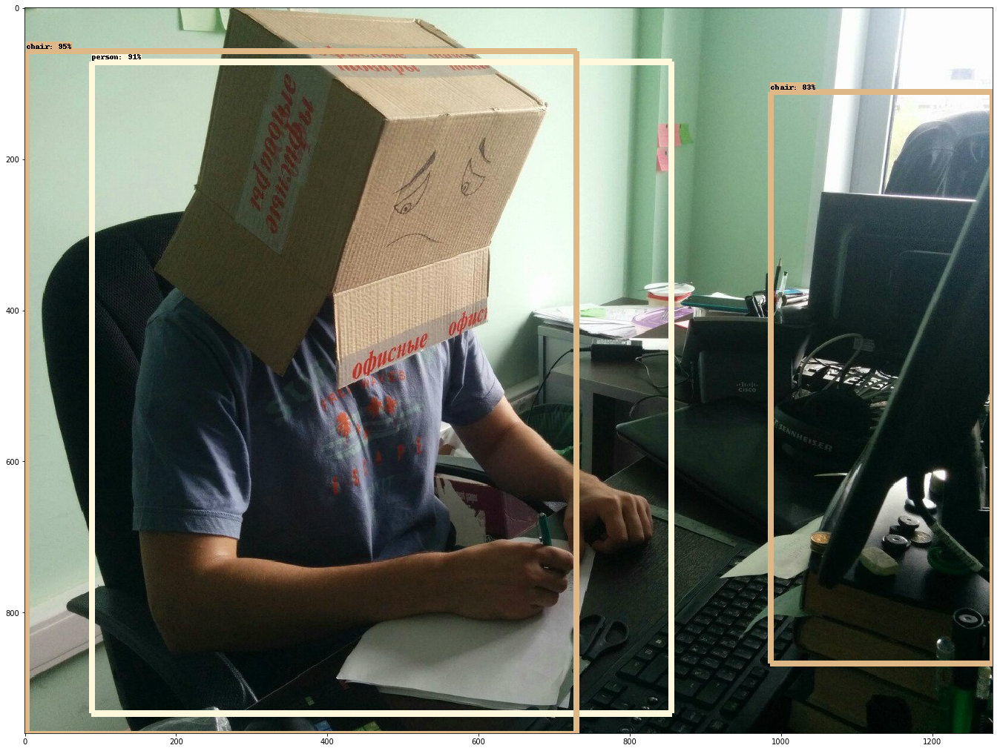

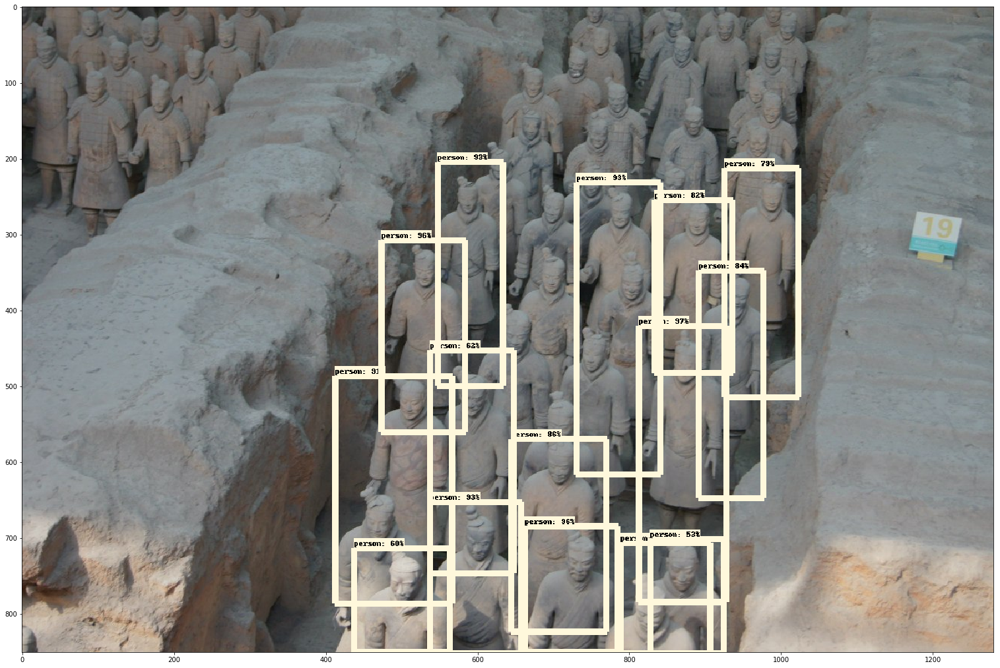

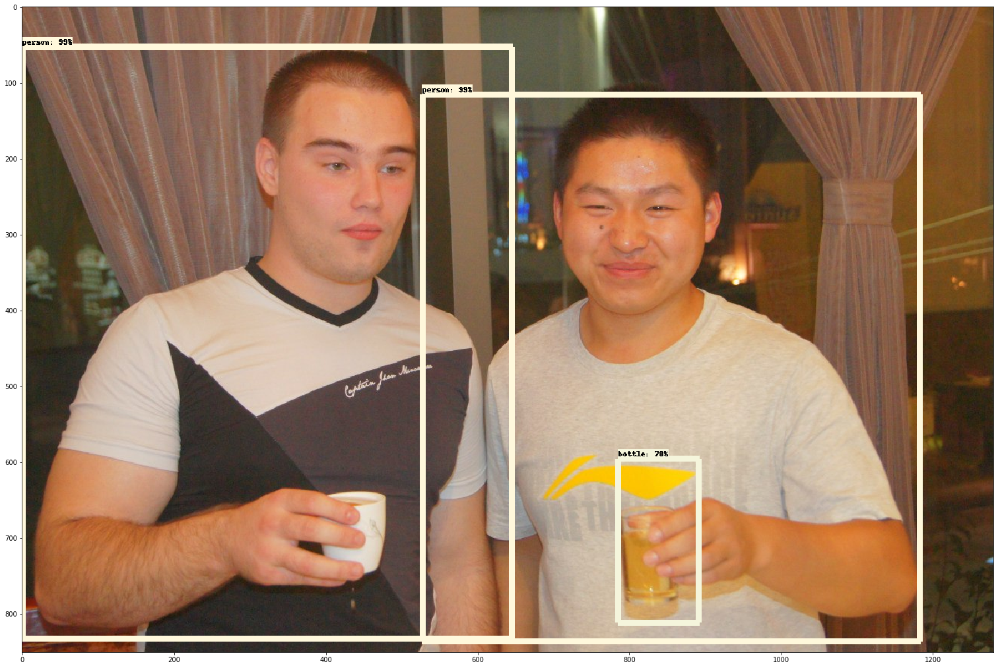

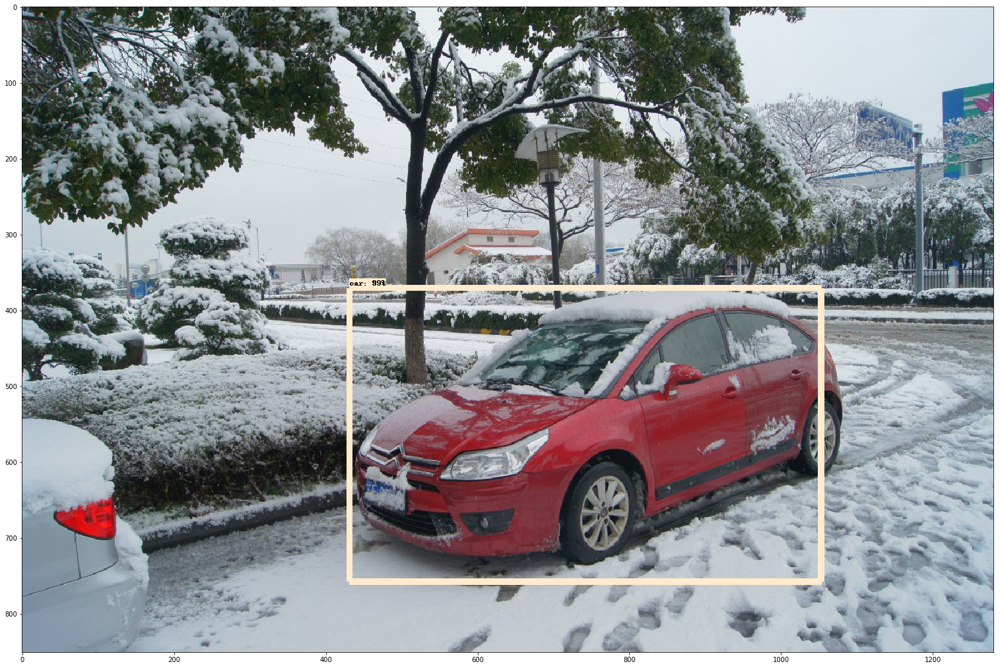

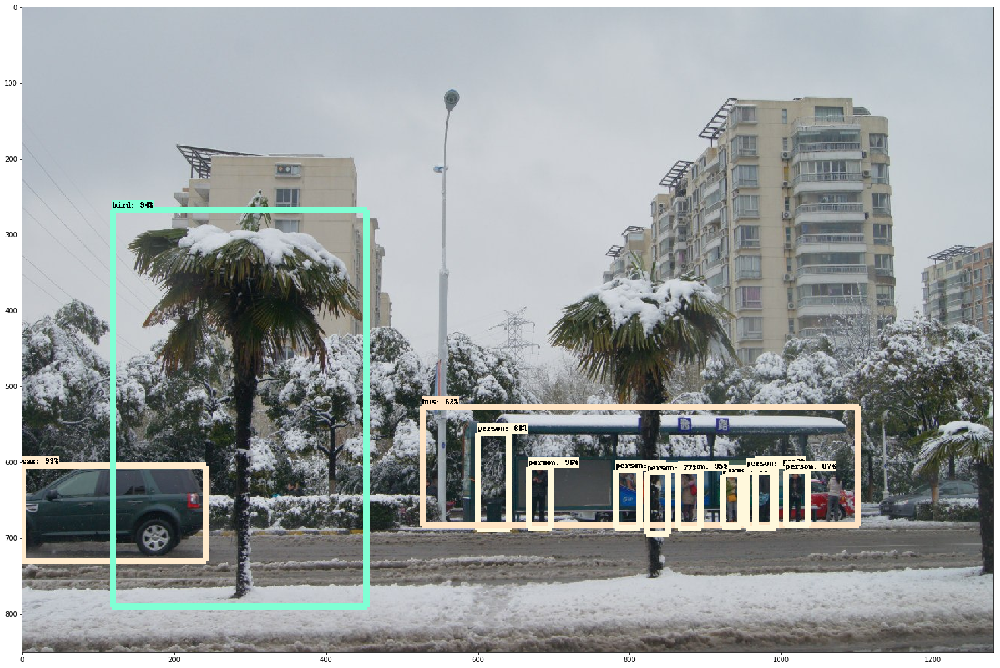

In [12]:
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        
        for image_path in TEST_IMAGE_PATHS:
            image = Image.open(image_path)
            image_np = load_image_into_numpy_array(image)
            image_np_expanded = np.expand_dims(image_np, axis=0)
            (boxes, scores, classes, num) = sess.run(
                [detection_boxes, detection_scores, detection_classes, num_detections],
                feed_dict={image_tensor: image_np_expanded})
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np,
                np.squeeze(boxes),
                np.squeeze(classes).astype(np.int32),
                np.squeeze(scores),
                category_index,
                use_normalized_coordinates=True,
                line_thickness=8)
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)